In [1]:
!nvidia-smi

Tue Jul 23 03:11:50 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

import torchvision
from torchvision import datasets, transforms
from torchvision.models import resnet18, resnet34
import os

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Part 0: CUB200 2011 Dataset


In [5]:
cp /content/drive/MyDrive/CUB_200_2011.tgz /content/

In [6]:
!tar -xvxf CUB_200_2011.tgz

Streaming output truncated to the last 5000 lines.
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0050_111087.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0079_113288.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0004_111989.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0068_113247.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0127_111935.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0094_112773.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0028_113217.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0126_110959.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0007_111029.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0096_111519.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0120_113001.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0010_112678.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0025_111669.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0084_111300.j

In [7]:
import shutil

In [8]:
data_dir = '/content/CUB_200_2011/'
images_dir = os.path.join(data_dir, 'images')

train_dir = os.path.join(data_dir, 'train')
os.makedirs(train_dir, exist_ok=True)
test_dir = os.path.join(data_dir, 'test')
os.makedirs(test_dir, exist_ok=True)

classes = os.listdir(images_dir)

with open('/content/CUB_200_2011/images.txt') as f:
  image_names = f.readlines()

with open('/content/CUB_200_2011/train_test_split.txt') as f:
  train_test_split = f.readlines()

for train_idx, image_name in zip(train_test_split, image_names):
  num, class_image_name = image_name.split()
  image_idx, train_flag = train_idx.split()
  image_path = os.path.join(images_dir, class_image_name)
  class_name = class_image_name.split('/')[0]
  train_class_dir = os.path.join(train_dir, class_name)
  os.makedirs(train_class_dir, exist_ok=True)
  test_class_dir = os.path.join(test_dir, class_name)
  os.makedirs(test_class_dir, exist_ok=True)
  if train_flag == '0':
    shutil.copy(image_path, train_class_dir)
  else:
    shutil.copy(image_path, test_class_dir)

In [9]:
# Data
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomApply([
      transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)], p=0.8
    ),
    transforms.RandomGrayscale(0.2),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# trainset = torchvision.datasets.CIFAR100(
#     root='./data', train=True, download=True, transform=transform_train)
trainset = datasets.ImageFolder(root='/content/CUB_200_2011/train/',
                                transform=transform_train)
trainloader = torch.utils.data.DataLoader(
    trainset, batch_size=128, shuffle=False, num_workers=2)

# testset = torchvision.datasets.CIFAR100(
#     root='./data', train=False, download=True, transform=transform_test)
testset = datasets.ImageFolder(root='/content/CUB_200_2011/test/',
                                transform=transform_test)
testloader = torch.utils.data.DataLoader(
    testset, batch_size=100, shuffle=False, num_workers=2)

In [10]:
batch = next(iter(trainloader))
batch[0].shape, batch[1].shape

(torch.Size([128, 3, 224, 224]), torch.Size([128]))

In [11]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_images(images, labels, classes, normalize=True):

    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(20, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)

        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        ax.set_title(classes[labels[i]])
        ax.axis('off')

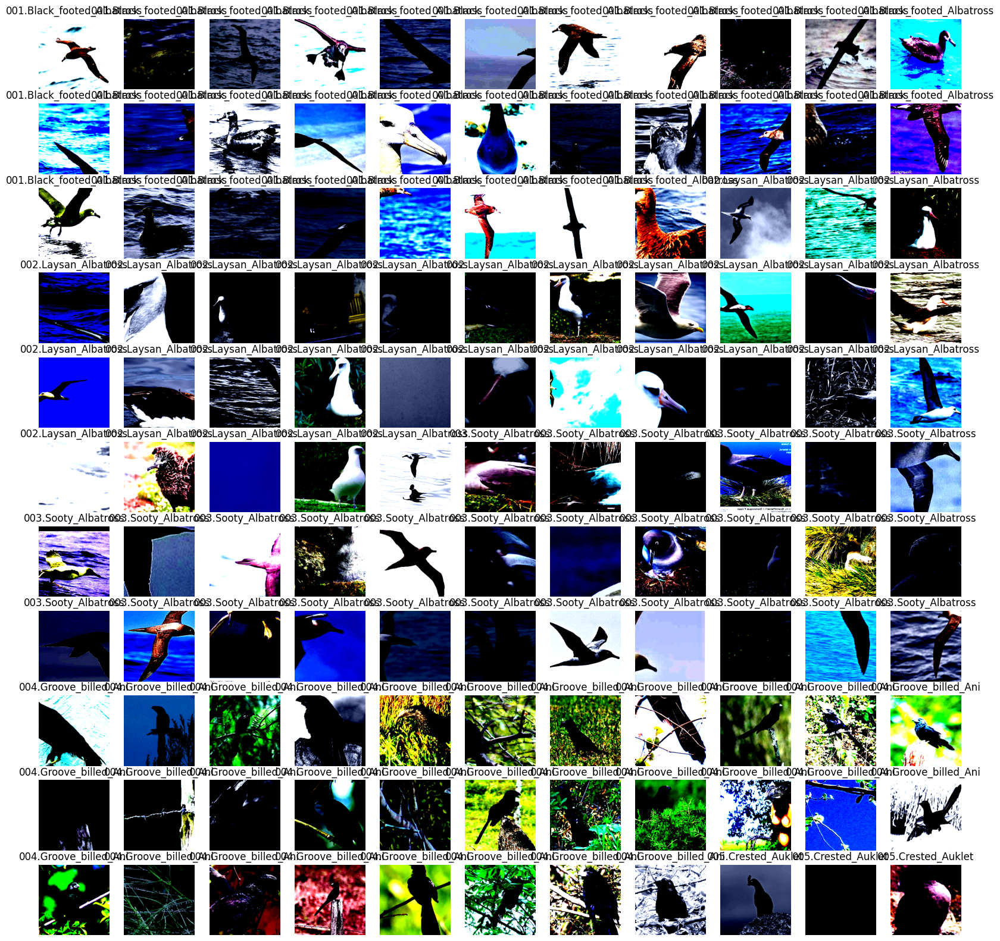

In [12]:
classes = trainset.classes

plot_images(batch[0], batch[1], classes, normalize=False)

In [13]:
from torch.utils.data import Dataset, DataLoader

In [14]:
class TwoCropTransform:
    """Create two crops of the same image"""
    def __init__(self, transform):
        self.transform = transform

    def __call__(self, x):
        return [self.transform(x), self.transform(x)]

In [15]:
class CUBDataset(Dataset):
  def __init__(self, phase):
    self.dataset = datasets.ImageFolder(root=f'/content/CUB_200_2011/{phase}/',
                                transform=transform_train)
    tr = TwoCropTransform(transform_train)
    # self.bbxs = []
  def __getitem__(self, item):
    img_tuple = self.dataset.imgs[item]
    label = img_tuple[1]
    img = self.dataset.loader(img_tuple[0])
    img1, img2 = tr(img)
    item2 = torch.randint(len(self.dataset))
    self.dataset.imgs[item2]
    # patch = img[self.bbxs[item][0]:self.bbxs[item][2], self.bbxs[item][1]:self.bbxs[item][3]]
    return patch, label

  def __len__(self):
    return len(self.dataset)

In [16]:
phase = 'train'
dataset = datasets.ImageFolder(root=f'/content/CUB_200_2011/{phase}/',
                                transform=transform_train)

In [17]:
len(dataset)

5794

In [18]:
trainset = CUBDataset(phase='train')
trainloader = torch.utils.data.DataLoader(
    trainset, batch_size=128, shuffle=False, num_workers=2)

# Part 1: EfficientNet

In [19]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━

In [20]:
from efficientnet_pytorch import EfficientNet
net = EfficientNet.from_pretrained('efficientnet-b0')

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 130MB/s]


Loaded pretrained weights for efficientnet-b0


In [21]:
net._fc = nn.Linear(1280, 200)

In [22]:
net

EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d((0, 1, 0, 1))
  )
  (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
        (static_padding): ZeroPad2d((1, 1, 1, 1))
      )
      (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        32, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        8, 32, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
        32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False
    

# Part 2: Edit Model

In [23]:
class SELayer(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SELayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [24]:
class SCLayer(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SCLayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [25]:
import torch.nn as nn
from torch.hub import load_state_dict_from_url
from torchvision.models import ResNet
# from senet.se_module import SELayer


def conv3x3(in_planes, out_planes, stride=1):
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride, padding=1, bias=False)


class SEBasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None,
                 *, reduction=16):
        super(SEBasicBlock, self).__init__()
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes, 1)
        self.bn2 = nn.BatchNorm2d(planes)
        self.se = SELayer(planes, reduction)
        self.sc = SCLayer(planes, reduction)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.se(out)
        out = self.sc(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class SEBottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None,
                 *, reduction=16):
        super(SEBottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride,
                               padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.se = SELayer(planes * 4, reduction)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)
        out = self.se(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


def se_resnet18(num_classes=1_000):
    """Constructs a ResNet-18 model.

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(SEBasicBlock, [2, 2, 2, 2], num_classes=num_classes)
    model.avgpool = nn.AdaptiveAvgPool2d(1)
    return model


def se_resnet34(num_classes=1_000):
    """Constructs a ResNet-34 model.

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(SEBasicBlock, [3, 4, 6, 3], num_classes=num_classes)
    model.avgpool = nn.AdaptiveAvgPool2d(1)
    return model


def se_resnet50(num_classes=1_000, pretrained=False):
    """Constructs a ResNet-50 model.

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(SEBottleneck, [3, 4, 6, 3], num_classes=num_classes)
    model.avgpool = nn.AdaptiveAvgPool2d(1)
    if pretrained:
        model.load_state_dict(load_state_dict_from_url(
            "https://github.com/moskomule/senet.pytorch/releases/download/archive/seresnet50-60a8950a85b2b.pkl"))
    return model


def se_resnet101(num_classes=1_000):
    """Constructs a ResNet-101 model.

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(SEBottleneck, [3, 4, 23, 3], num_classes=num_classes)
    model.avgpool = nn.AdaptiveAvgPool2d(1)
    return model


def se_resnet152(num_classes=1_000):
    """Constructs a ResNet-152 model.

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(SEBottleneck, [3, 8, 36, 3], num_classes=num_classes)
    model.avgpool = nn.AdaptiveAvgPool2d(1)
    return model


class CifarSEBasicBlock(nn.Module):
    def __init__(self, inplanes, planes, stride=1, reduction=16):
        super(CifarSEBasicBlock, self).__init__()
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.BatchNorm2d(planes)
        self.se = SELayer(planes, reduction)
        if inplanes != planes:
            self.downsample = nn.Sequential(nn.Conv2d(inplanes, planes, kernel_size=1, stride=stride, bias=False),
                                            nn.BatchNorm2d(planes))
        else:
            self.downsample = lambda x: x
        self.stride = stride

    def forward(self, x):
        residual = self.downsample(x)
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.se(out)

        out += residual
        out = self.relu(out)

        return out


class CifarSEResNet(nn.Module):
    def __init__(self, block, n_size, num_classes=10, reduction=16):
        super(CifarSEResNet, self).__init__()
        self.inplane = 16
        self.conv1 = nn.Conv2d(
            3, self.inplane, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(self.inplane)
        self.relu = nn.ReLU(inplace=True)
        self.layer1 = self._make_layer(
            block, 16, blocks=n_size, stride=1, reduction=reduction)
        self.layer2 = self._make_layer(
            block, 32, blocks=n_size, stride=2, reduction=reduction)
        self.layer3 = self._make_layer(
            block, 64, blocks=n_size, stride=2, reduction=reduction)
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(64, num_classes)
        self.initialize()

    def initialize(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def _make_layer(self, block, planes, blocks, stride, reduction):
        strides = [stride] + [1] * (blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.inplane, planes, stride, reduction))
            self.inplane = planes

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)

        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)

        return x


class CifarSEPreActResNet(CifarSEResNet):
    def __init__(self, block, n_size, num_classes=10, reduction=16):
        super(CifarSEPreActResNet, self).__init__(
            block, n_size, num_classes, reduction)
        self.bn1 = nn.BatchNorm2d(self.inplane)
        self.initialize()

    def forward(self, x):
        x = self.conv1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)

        x = self.bn1(x)
        x = self.relu(x)

        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)


def se_resnet20(**kwargs):
    """Constructs a ResNet-18 model.

    """
    model = CifarSEResNet(CifarSEBasicBlock, 3, **kwargs)
    return model


def se_resnet32(**kwargs):
    """Constructs a ResNet-34 model.

    """
    model = CifarSEResNet(CifarSEBasicBlock, 5, **kwargs)
    return model


def se_resnet56(**kwargs):
    """Constructs a ResNet-34 model.

    """
    model = CifarSEResNet(CifarSEBasicBlock, 9, **kwargs)
    return model


def se_preactresnet20(**kwargs):
    """Constructs a ResNet-18 model.

    """
    model = CifarSEPreActResNet(CifarSEBasicBlock, 3, **kwargs)
    return model


def se_preactresnet32(**kwargs):
    """Constructs a ResNet-34 model.

    """
    model = CifarSEPreActResNet(CifarSEBasicBlock, 5, **kwargs)
    return model


def se_preactresnet56(**kwargs):
    """Constructs a ResNet-34 model.

    """
    model = CifarSEPreActResNet(CifarSEBasicBlock, 9, **kwargs)
    return model

In [26]:
net = se_resnet18()
net

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): SEBasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (se): SELayer(
        (avg_pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=False)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_featu

In [27]:
netlist = list(net.children())

In [28]:
netlist.__class__

list

In [30]:
class MyModel(nn.Module):
  def __init__(self):
    super(MyModel).__init__()
    self.backbone = nn.Sequential(*netlist[:-2])
    self.selayer = SELayer()
    self.sclayer = SCLayer()
    self.fc1 = nn.Linear(512, 200)
    self.fc2 = nn.Linear(512, 200)

  def forward(self, x, y):
    y = self.backbone(x)
    out1 = self.selayer(y)
    out2 = self.sclayer(y)
    out1,2 = avgpool, flatten
    out1 = self.fc1(out1)
    out2 = self.fc2(out2)
    out = out1 + out2
    out = torch.cat([out1, out2])
    return out1, out2


In [31]:
nn.Sequential(*netlist[:-3])
c1 = netlist[-3]
c2 = netlist[-3]
c3 = netlist[-3]

In [33]:
for name, param in net.named_parameters():
  if 'se' not in name:
    param.requires_grad_(False)
  else:
    print(name)

layer1.0.se.fc.0.weight
layer1.0.se.fc.2.weight
layer1.1.se.fc.0.weight
layer1.1.se.fc.2.weight
layer2.0.se.fc.0.weight
layer2.0.se.fc.2.weight
layer2.1.se.fc.0.weight
layer2.1.se.fc.2.weight
layer3.0.se.fc.0.weight
layer3.0.se.fc.2.weight
layer3.1.se.fc.0.weight
layer3.1.se.fc.2.weight
layer4.0.se.fc.0.weight
layer4.0.se.fc.2.weight
layer4.1.se.fc.0.weight
layer4.1.se.fc.2.weight


In [34]:
for name, param in net.named_parameters():
  if param.requires_grad:
    print(name)

layer1.0.se.fc.0.weight
layer1.0.se.fc.2.weight
layer1.1.se.fc.0.weight
layer1.1.se.fc.2.weight
layer2.0.se.fc.0.weight
layer2.0.se.fc.2.weight
layer2.1.se.fc.0.weight
layer2.1.se.fc.2.weight
layer3.0.se.fc.0.weight
layer3.0.se.fc.2.weight
layer3.1.se.fc.0.weight
layer3.1.se.fc.2.weight
layer4.0.se.fc.0.weight
layer4.0.se.fc.2.weight
layer4.1.se.fc.0.weight
layer4.1.se.fc.2.weight


In [35]:
def count_parameters(model):
    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return params/1000000

In [36]:
count_parameters(net)

0.08704

# Part 3: Train

In [37]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

import torchvision
from torchvision import datasets, transforms
from torchvision.models import resnet18, resnet34
import os

In [38]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [39]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

In [81]:
try:
    from google import colab
    COLAB_ENV = True
except (ImportError, ModuleNotFoundError):
    COLAB_ENV = False

# Load the TensorBoard notebook extension
if COLAB_ENV:
    %load_ext tensorboard
    %tensorboard --logdir runs  --host localhost --port 8088
else:
    print("To use tensorboard, please use this notebook in a Google Colab environment.")

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [41]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [42]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 9.7 MB/s eta 0:00:00


In [62]:
import sys
import torchmetrics
import logging
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger('classification')
# logger.setLevel(logging.INFO)
writer = SummaryWriter()

In [63]:
logging.info('test')

INFO:root:test


In [64]:
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(
    root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(
    trainset, batch_size=128, shuffle=False, num_workers=2)

testset = torchvision.datasets.CIFAR10(
    root='./data', train=False, download=True, transform=transform_test)
testloader = torch.utils.data.DataLoader(
    testset, batch_size=100, shuffle=False, num_workers=2)

Files already downloaded and verified
Files already downloaded and verified


In [66]:
# Training
def train(epoch):
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 20:
        #     break
        scheduler.step()
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    logger.info(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')


def test(epoch, checkpoint):
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        logger.info(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), epoch=epoch)


class Checkpoint(object):
    def __init__(self, model_name):
        self.best_acc = 0.
        self.folder = 'checkpoint'
        self.model_name = model_name
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, epoch=-1):
        if acc > self.best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), self.model_name + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [67]:
class LeNet5(nn.Module):
    def __init__(self):
        super(LeNet5, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(400, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 400)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [68]:
net = LeNet5()
net.to(device)

LeNet5(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=10, bias=True)
)

In [69]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.1,
                      momentum=0.9, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20000, eta_min=1e-6)

In [70]:
writer = SummaryWriter()
checkpoint = Checkpoint('ckpt-lenet')
start, end = 0, 50
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
INFO:classification:Train: Epoch:0 Loss:1.918 Accuracy:0.2818
INFO:classification:Test:  Epoch:0 Loss:1.773 Accuracy:0.3478
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:1 Loss:1.794 Accuracy:0.3354
INFO:classification:Test:  Epoch:1 Loss:1.709 Accuracy:0.377
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:2 Loss:1.783 Accuracy:0.3425
INFO:classification:Test:  Epoch:2 Loss:1.732 Accuracy:0.3836
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:3 Loss:1.725 Accuracy:0.3719
INFO:classification:Test:  Epoch:3 Loss:1.629 Accuracy:0.4114
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:4 Loss:1.708 Accuracy:0.3784
INFO:classification:Test:  Epoch:4 Loss:1.685 Accuracy:0.3768


INFO:classification:Train: Epoch:5 Loss:1.682 Accuracy:0.3898
INFO:classification:Test:  Epoch:5 Loss:1.682 Accuracy:0.399


INFO:classification:Train: Epoch:6 Loss:1.677 Accuracy:0.3887
INFO:classification:Test:  Epoch:6 Loss:1.546 Accuracy:0.441
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:7 Loss:1.657 Accuracy:0.4012
INFO:classification:Test:  Epoch:7 Loss:1.631 Accuracy:0.4256


INFO:classification:Train: Epoch:8 Loss:1.668 Accuracy:0.3994
INFO:classification:Test:  Epoch:8 Loss:1.623 Accuracy:0.4181


INFO:classification:Train: Epoch:9 Loss:1.609 Accuracy:0.4216
INFO:classification:Test:  Epoch:9 Loss:1.572 Accuracy:0.4369


INFO:classification:Train: Epoch:10 Loss:1.61 Accuracy:0.423
INFO:classification:Test:  Epoch:10 Loss:1.556 Accuracy:0.4421
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:11 Loss:1.581 Accuracy:0.4361
INFO:classification:Test:  Epoch:11 Loss:1.537 Accuracy:0.449
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:12 Loss:1.568 Accuracy:0.4381
INFO:classification:Test:  Epoch:12 Loss:1.539 Accuracy:0.4558
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:13 Loss:1.537 Accuracy:0.4533
INFO:classification:Test:  Epoch:13 Loss:1.486 Accuracy:0.4711
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:14 Loss:1.534 Accuracy:0.4546
INFO:classification:Test:  Epoch:14 Loss:1.385 Accuracy:0.5126
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:15 Loss:1.516 Accuracy:0.4622
INFO:classification:Test:  Epoch:15 Loss:1.485 Accuracy:0.4829


INFO:classification:Train: Epoch:16 Loss:1.498 Accuracy:0.4689
INFO:classification:Test:  Epoch:16 Loss:1.458 Accuracy:0.4804


INFO:classification:Train: Epoch:17 Loss:1.481 Accuracy:0.4763
INFO:classification:Test:  Epoch:17 Loss:1.416 Accuracy:0.5068


INFO:classification:Train: Epoch:18 Loss:1.452 Accuracy:0.4876
INFO:classification:Test:  Epoch:18 Loss:1.276 Accuracy:0.5541
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:19 Loss:1.422 Accuracy:0.4971
INFO:classification:Test:  Epoch:19 Loss:1.276 Accuracy:0.5571
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:20 Loss:1.414 Accuracy:0.4994
INFO:classification:Test:  Epoch:20 Loss:1.316 Accuracy:0.5394


INFO:classification:Train: Epoch:21 Loss:1.398 Accuracy:0.5073
INFO:classification:Test:  Epoch:21 Loss:1.336 Accuracy:0.5338


INFO:classification:Train: Epoch:22 Loss:1.376 Accuracy:0.5158
INFO:classification:Test:  Epoch:22 Loss:1.298 Accuracy:0.5532


INFO:classification:Train: Epoch:23 Loss:1.347 Accuracy:0.5281
INFO:classification:Test:  Epoch:23 Loss:1.221 Accuracy:0.5844
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:24 Loss:1.33 Accuracy:0.5353
INFO:classification:Test:  Epoch:24 Loss:1.216 Accuracy:0.5707


INFO:classification:Train: Epoch:25 Loss:1.308 Accuracy:0.5414
INFO:classification:Test:  Epoch:25 Loss:1.244 Accuracy:0.5612


INFO:classification:Train: Epoch:26 Loss:1.288 Accuracy:0.5485
INFO:classification:Test:  Epoch:26 Loss:1.161 Accuracy:0.6006
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:27 Loss:1.254 Accuracy:0.5631
INFO:classification:Test:  Epoch:27 Loss:1.133 Accuracy:0.6045
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:28 Loss:1.233 Accuracy:0.5702
INFO:classification:Test:  Epoch:28 Loss:1.145 Accuracy:0.604


INFO:classification:Train: Epoch:29 Loss:1.196 Accuracy:0.5799
INFO:classification:Test:  Epoch:29 Loss:1.07 Accuracy:0.6349
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:30 Loss:1.177 Accuracy:0.5889
INFO:classification:Test:  Epoch:30 Loss:1.064 Accuracy:0.631


INFO:classification:Train: Epoch:31 Loss:1.158 Accuracy:0.5963
INFO:classification:Test:  Epoch:31 Loss:1.132 Accuracy:0.6095


INFO:classification:Train: Epoch:32 Loss:1.13 Accuracy:0.6046
INFO:classification:Test:  Epoch:32 Loss:1.045 Accuracy:0.6421
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:33 Loss:1.1 Accuracy:0.6135
INFO:classification:Test:  Epoch:33 Loss:1.053 Accuracy:0.6413


INFO:classification:Train: Epoch:34 Loss:1.086 Accuracy:0.6208
INFO:classification:Test:  Epoch:34 Loss:0.9582 Accuracy:0.6711
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:35 Loss:1.062 Accuracy:0.6293
INFO:classification:Test:  Epoch:35 Loss:0.9651 Accuracy:0.665


INFO:classification:Train: Epoch:36 Loss:1.028 Accuracy:0.6411
INFO:classification:Test:  Epoch:36 Loss:0.9803 Accuracy:0.6571


INFO:classification:Train: Epoch:37 Loss:1.017 Accuracy:0.6445
INFO:classification:Test:  Epoch:37 Loss:0.9333 Accuracy:0.6782
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:38 Loss:0.9949 Accuracy:0.6506
INFO:classification:Test:  Epoch:38 Loss:0.9229 Accuracy:0.6842
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:39 Loss:0.9642 Accuracy:0.6618
INFO:classification:Test:  Epoch:39 Loss:0.9159 Accuracy:0.6841


INFO:classification:Train: Epoch:40 Loss:0.956 Accuracy:0.6692
INFO:classification:Test:  Epoch:40 Loss:0.894 Accuracy:0.6929
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:41 Loss:0.9345 Accuracy:0.672
INFO:classification:Test:  Epoch:41 Loss:0.8686 Accuracy:0.6985
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:42 Loss:0.9118 Accuracy:0.6808
INFO:classification:Test:  Epoch:42 Loss:0.8591 Accuracy:0.7053
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:43 Loss:0.9017 Accuracy:0.6822
INFO:classification:Test:  Epoch:43 Loss:0.8517 Accuracy:0.7057
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:44 Loss:0.8858 Accuracy:0.6871
INFO:classification:Test:  Epoch:44 Loss:0.8354 Accuracy:0.7093
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:45 Loss:0.8736 Accuracy:0.6951
INFO:classification:Test:  Epoch:45 Loss:0.8289 Accuracy:0.7122
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:46 Loss:0.857 Accuracy:0.6993
INFO:classification:Test:  Epoch:46 Loss:0.8218 Accuracy:0.7157
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:47 Loss:0.8474 Accuracy:0.7037
INFO:classification:Test:  Epoch:47 Loss:0.8155 Accuracy:0.7153


INFO:classification:Train: Epoch:48 Loss:0.8464 Accuracy:0.7011
INFO:classification:Test:  Epoch:48 Loss:0.8125 Accuracy:0.7167
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:49 Loss:0.8442 Accuracy:0.7045
INFO:classification:Test:  Epoch:49 Loss:0.8114 Accuracy:0.7172
INFO:classification:Saving checkpoint...


In [71]:
ckpt = torch.load('/content/checkpoint/ckpt-lenet.pth')
logger.info(f'Best Accuracy: {ckpt["acc"]:.4}')

INFO:classification:Best Accuracy: 0.7172


## Train MobileNet base model

In [72]:
from torchvision import models
net = models.mobilenet_v2(True)
net.classifier[1] = nn.Linear(1280, 10)
net.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [73]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.01,
                      momentum=0.9, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200, eta_min=1e-6)

In [74]:
writer = SummaryWriter()
checkpoint = Checkpoint('ckpt-mobilenet')
start, end = 0, 50
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

INFO:classification:Train: Epoch:0 Loss:1.633 Accuracy:0.4009
INFO:classification:Test:  Epoch:0 Loss:1.438 Accuracy:0.4792
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:1 Loss:1.269 Accuracy:0.5453
INFO:classification:Test:  Epoch:1 Loss:1.258 Accuracy:0.5558
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:2 Loss:1.101 Accuracy:0.6036
INFO:classification:Test:  Epoch:2 Loss:1.006 Accuracy:0.6435
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:3 Loss:0.9898 Accuracy:0.6466
INFO:classification:Test:  Epoch:3 Loss:0.9327 Accuracy:0.6741
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:4 Loss:0.9016 Accuracy:0.6827
INFO:classification:Test:  Epoch:4 Loss:0.851 Accuracy:0.6952
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:5 Loss:0.8452 Accuracy:0.7027
INFO:classification:Test:  Epoch:5 Loss:0.7938 Accuracy:0.7198
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:6 Loss:0.7925 Accuracy:0.7235
INFO:classification:Test:  Epoch:6 Loss:0.7529 Accuracy:0.7361
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:7 Loss:0.7516 Accuracy:0.7364
INFO:classification:Test:  Epoch:7 Loss:0.6931 Accuracy:0.7537
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:8 Loss:0.7187 Accuracy:0.7455
INFO:classification:Test:  Epoch:8 Loss:0.6614 Accuracy:0.7688
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:9 Loss:0.6911 Accuracy:0.7565
INFO:classification:Test:  Epoch:9 Loss:0.6503 Accuracy:0.7723
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:10 Loss:0.6641 Accuracy:0.7674
INFO:classification:Test:  Epoch:10 Loss:0.6319 Accuracy:0.7793
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:11 Loss:0.6451 Accuracy:0.7752
INFO:classification:Test:  Epoch:11 Loss:0.6034 Accuracy:0.7909
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:12 Loss:0.6258 Accuracy:0.7811
INFO:classification:Test:  Epoch:12 Loss:0.5821 Accuracy:0.7964
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:13 Loss:0.6089 Accuracy:0.7874
INFO:classification:Test:  Epoch:13 Loss:0.5718 Accuracy:0.8004
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:14 Loss:0.5964 Accuracy:0.7917
INFO:classification:Test:  Epoch:14 Loss:0.5652 Accuracy:0.8053
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:15 Loss:0.581 Accuracy:0.7952
INFO:classification:Test:  Epoch:15 Loss:0.5607 Accuracy:0.8049


INFO:classification:Train: Epoch:16 Loss:0.5648 Accuracy:0.8034
INFO:classification:Test:  Epoch:16 Loss:0.5474 Accuracy:0.8155
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:17 Loss:0.5518 Accuracy:0.8075
INFO:classification:Test:  Epoch:17 Loss:0.5386 Accuracy:0.8162
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:18 Loss:0.544 Accuracy:0.8085
INFO:classification:Test:  Epoch:18 Loss:0.5361 Accuracy:0.8175
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:19 Loss:0.5358 Accuracy:0.8114
INFO:classification:Test:  Epoch:19 Loss:0.5359 Accuracy:0.8161


INFO:classification:Train: Epoch:20 Loss:0.524 Accuracy:0.815
INFO:classification:Test:  Epoch:20 Loss:0.5265 Accuracy:0.8205
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:21 Loss:0.5122 Accuracy:0.821
INFO:classification:Test:  Epoch:21 Loss:0.5269 Accuracy:0.8218
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:22 Loss:0.5033 Accuracy:0.8211
INFO:classification:Test:  Epoch:22 Loss:0.5171 Accuracy:0.822
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:23 Loss:0.4926 Accuracy:0.8287
INFO:classification:Test:  Epoch:23 Loss:0.5126 Accuracy:0.8246
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:24 Loss:0.4892 Accuracy:0.8287
INFO:classification:Test:  Epoch:24 Loss:0.5089 Accuracy:0.8252
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:25 Loss:0.4856 Accuracy:0.8298
INFO:classification:Test:  Epoch:25 Loss:0.5067 Accuracy:0.8256
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:26 Loss:0.4778 Accuracy:0.8326
INFO:classification:Test:  Epoch:26 Loss:0.5036 Accuracy:0.8265
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:27 Loss:0.4686 Accuracy:0.8341
INFO:classification:Test:  Epoch:27 Loss:0.5101 Accuracy:0.8267
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:28 Loss:0.4655 Accuracy:0.8372
INFO:classification:Test:  Epoch:28 Loss:0.5051 Accuracy:0.8279
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:29 Loss:0.4572 Accuracy:0.8387
INFO:classification:Test:  Epoch:29 Loss:0.5094 Accuracy:0.8243


INFO:classification:Train: Epoch:30 Loss:0.4508 Accuracy:0.8397
INFO:classification:Test:  Epoch:30 Loss:0.5141 Accuracy:0.8225


INFO:classification:Train: Epoch:31 Loss:0.4508 Accuracy:0.8398
INFO:classification:Test:  Epoch:31 Loss:0.5242 Accuracy:0.8229


INFO:classification:Train: Epoch:32 Loss:0.4414 Accuracy:0.845
INFO:classification:Test:  Epoch:32 Loss:0.5328 Accuracy:0.8202


INFO:classification:Train: Epoch:33 Loss:0.436 Accuracy:0.8463
INFO:classification:Test:  Epoch:33 Loss:0.5349 Accuracy:0.8205


INFO:classification:Train: Epoch:34 Loss:0.4299 Accuracy:0.8476
INFO:classification:Test:  Epoch:34 Loss:0.5488 Accuracy:0.8137


INFO:classification:Train: Epoch:35 Loss:0.4259 Accuracy:0.8497
INFO:classification:Test:  Epoch:35 Loss:0.5511 Accuracy:0.8154


INFO:classification:Train: Epoch:36 Loss:0.4187 Accuracy:0.8524
INFO:classification:Test:  Epoch:36 Loss:0.5684 Accuracy:0.8113


INFO:classification:Train: Epoch:37 Loss:0.4192 Accuracy:0.8519
INFO:classification:Test:  Epoch:37 Loss:0.5561 Accuracy:0.8107


INFO:classification:Train: Epoch:38 Loss:0.4168 Accuracy:0.8527
INFO:classification:Test:  Epoch:38 Loss:0.5978 Accuracy:0.8043


INFO:classification:Train: Epoch:39 Loss:0.4206 Accuracy:0.8508
INFO:classification:Test:  Epoch:39 Loss:0.5909 Accuracy:0.8002


INFO:classification:Train: Epoch:40 Loss:0.41 Accuracy:0.8545
INFO:classification:Test:  Epoch:40 Loss:0.5783 Accuracy:0.8085


INFO:classification:Train: Epoch:41 Loss:0.4015 Accuracy:0.8578
INFO:classification:Test:  Epoch:41 Loss:0.6353 Accuracy:0.7975


INFO:classification:Train: Epoch:42 Loss:0.4033 Accuracy:0.8576
INFO:classification:Test:  Epoch:42 Loss:0.5947 Accuracy:0.8095


INFO:classification:Train: Epoch:43 Loss:0.3972 Accuracy:0.8607
INFO:classification:Test:  Epoch:43 Loss:0.67 Accuracy:0.7878


INFO:classification:Train: Epoch:44 Loss:0.4005 Accuracy:0.8598
INFO:classification:Test:  Epoch:44 Loss:0.6089 Accuracy:0.8049


INFO:classification:Train: Epoch:45 Loss:0.3906 Accuracy:0.8625
INFO:classification:Test:  Epoch:45 Loss:0.599 Accuracy:0.8105


INFO:classification:Train: Epoch:46 Loss:0.3947 Accuracy:0.8604
INFO:classification:Test:  Epoch:46 Loss:0.6035 Accuracy:0.8124


INFO:classification:Train: Epoch:47 Loss:0.388 Accuracy:0.8653
INFO:classification:Test:  Epoch:47 Loss:0.6031 Accuracy:0.8111


INFO:classification:Train: Epoch:48 Loss:0.3836 Accuracy:0.8659
INFO:classification:Test:  Epoch:48 Loss:0.6269 Accuracy:0.8068


INFO:classification:Train: Epoch:49 Loss:0.3837 Accuracy:0.8641
INFO:classification:Test:  Epoch:49 Loss:0.5692 Accuracy:0.8239


## Knowledge Distillation

In [75]:
def loss_fn_kd(outputs, labels, teacher_outputs, alpha, T):
    """
    Compute the knowledge-distillation (KD) loss given outputs, labels.
    "Hyperparameters": temperature and alpha
    NOTE: the KL Divergence for PyTorch comparing the softmaxs of teacher
    and student expects the input tensor to be log probabilities! See Issue #2
    """
    KD_loss = nn.KLDivLoss()(F.log_softmax(outputs/T, dim=1),
                             F.softmax(teacher_outputs/T, dim=1)) * (alpha * T * T) + \
              F.cross_entropy(outputs, labels) * (1. - alpha)

    return KD_loss

In [83]:
# Training
def train(epoch):
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        with torch.no_grad():
          outputs2 = teacher(inputs)
        loss = loss_fn_kd(outputs, targets, outputs2, 0.6, 10)
        # loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 20:
        #     break
        scheduler.step()
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    logger.info(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')


def test(epoch, checkpoint):
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        logger.info(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), epoch=epoch)


class Checkpoint(object):
    def __init__(self, model_name):
        self.best_acc = 0.
        self.folder = 'chekpoint'
        self.model_name = model_name
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, epoch=-1):
        if acc > self.best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), self.model_name + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [77]:
net = LeNet5()
net.to(device)

LeNet5(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=10, bias=True)
)

In [79]:
teacher = models.mobilenet_v2(True)
teacher.classifier[1] = nn.Linear(1280, 10)
teacher.load_state_dict(torch.load('/content/checkpoint/ckpt-mobilenet.pth')['net'])
teacher.eval()
teacher.to(device)

MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [80]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.1,
                      momentum=0.9, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20000, eta_min=1e-6)

In [84]:
writer = SummaryWriter()
checkpoint = Checkpoint('ckpt-student')
start, end = 0, 50
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:2976: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(
INFO:classification:Train: Epoch:0 Loss:0.9805 Accuracy:0.3122
INFO:classification:Test:  Epoch:0 Loss:1.707 Accuracy:0.3884
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:1 Loss:0.8201 Accuracy:0.4202
INFO:classification:Test:  Epoch:1 Loss:1.42 Accuracy:0.4912
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:2 Loss:0.764 Accuracy:0.4667
INFO:classification:Test:  Epoch:2 Loss:1.429 Accuracy:0.4896


INFO:classification:Train: Epoch:3 Loss:0.7256 Accuracy:0.493
INFO:classification:Test:  Epoch:3 Loss:1.292 Accuracy:0.5326
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:4 Loss:0.7015 Accuracy:0.5148
INFO:classification:Test:  Epoch:4 Loss:1.279 Accuracy:0.5481
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:5 Loss:0.6863 Accuracy:0.5267
INFO:classification:Test:  Epoch:5 Loss:1.28 Accuracy:0.5527
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:6 Loss:0.6713 Accuracy:0.5348
INFO:classification:Test:  Epoch:6 Loss:1.217 Accuracy:0.5726
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:7 Loss:0.657 Accuracy:0.5449
INFO:classification:Test:  Epoch:7 Loss:1.237 Accuracy:0.5662


INFO:classification:Train: Epoch:8 Loss:0.65 Accuracy:0.5513
INFO:classification:Test:  Epoch:8 Loss:1.242 Accuracy:0.5645


INFO:classification:Train: Epoch:9 Loss:0.6418 Accuracy:0.557
INFO:classification:Test:  Epoch:9 Loss:1.182 Accuracy:0.5948
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:10 Loss:0.6363 Accuracy:0.5609
INFO:classification:Test:  Epoch:10 Loss:1.119 Accuracy:0.6117
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:11 Loss:0.6323 Accuracy:0.5634
INFO:classification:Test:  Epoch:11 Loss:1.242 Accuracy:0.5672


INFO:classification:Train: Epoch:12 Loss:0.6207 Accuracy:0.5734
INFO:classification:Test:  Epoch:12 Loss:1.09 Accuracy:0.6224
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:13 Loss:0.6141 Accuracy:0.5756
INFO:classification:Test:  Epoch:13 Loss:1.106 Accuracy:0.6131


INFO:classification:Train: Epoch:14 Loss:0.6101 Accuracy:0.58
INFO:classification:Test:  Epoch:14 Loss:1.135 Accuracy:0.6035


INFO:classification:Train: Epoch:15 Loss:0.5971 Accuracy:0.5862
INFO:classification:Test:  Epoch:15 Loss:1.092 Accuracy:0.6183


INFO:classification:Train: Epoch:16 Loss:0.5922 Accuracy:0.593
INFO:classification:Test:  Epoch:16 Loss:1.101 Accuracy:0.6191


INFO:classification:Train: Epoch:17 Loss:0.5885 Accuracy:0.5928
INFO:classification:Test:  Epoch:17 Loss:1.091 Accuracy:0.6194


INFO:classification:Train: Epoch:18 Loss:0.5802 Accuracy:0.5978
INFO:classification:Test:  Epoch:18 Loss:1.116 Accuracy:0.6134


INFO:classification:Train: Epoch:19 Loss:0.574 Accuracy:0.6017
INFO:classification:Test:  Epoch:19 Loss:1.119 Accuracy:0.6142


INFO:classification:Train: Epoch:20 Loss:0.563 Accuracy:0.611
INFO:classification:Test:  Epoch:20 Loss:1.079 Accuracy:0.6381
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:21 Loss:0.5538 Accuracy:0.6169
INFO:classification:Test:  Epoch:21 Loss:1.065 Accuracy:0.6338


INFO:classification:Train: Epoch:22 Loss:0.5539 Accuracy:0.6166
INFO:classification:Test:  Epoch:22 Loss:1.01 Accuracy:0.6542
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:23 Loss:0.543 Accuracy:0.6225
INFO:classification:Test:  Epoch:23 Loss:1.004 Accuracy:0.6498


INFO:classification:Train: Epoch:24 Loss:0.5388 Accuracy:0.6247
INFO:classification:Test:  Epoch:24 Loss:0.9779 Accuracy:0.6568
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:25 Loss:0.5254 Accuracy:0.6339
INFO:classification:Test:  Epoch:25 Loss:0.9991 Accuracy:0.6493


INFO:classification:Train: Epoch:26 Loss:0.5184 Accuracy:0.6383
INFO:classification:Test:  Epoch:26 Loss:0.9685 Accuracy:0.6651
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:27 Loss:0.5139 Accuracy:0.6418
INFO:classification:Test:  Epoch:27 Loss:0.9607 Accuracy:0.6681
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:28 Loss:0.5032 Accuracy:0.6478
INFO:classification:Test:  Epoch:28 Loss:0.9495 Accuracy:0.6716
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:29 Loss:0.4999 Accuracy:0.652
INFO:classification:Test:  Epoch:29 Loss:0.9215 Accuracy:0.6817
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:30 Loss:0.4934 Accuracy:0.6569
INFO:classification:Test:  Epoch:30 Loss:0.9073 Accuracy:0.6849
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:31 Loss:0.4801 Accuracy:0.6636
INFO:classification:Test:  Epoch:31 Loss:0.8903 Accuracy:0.6885
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:32 Loss:0.4791 Accuracy:0.6645
INFO:classification:Test:  Epoch:32 Loss:0.8786 Accuracy:0.6979
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:33 Loss:0.4697 Accuracy:0.6695
INFO:classification:Test:  Epoch:33 Loss:0.8566 Accuracy:0.7053
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:34 Loss:0.4607 Accuracy:0.6766
INFO:classification:Test:  Epoch:34 Loss:0.8595 Accuracy:0.7041


INFO:classification:Train: Epoch:35 Loss:0.4535 Accuracy:0.6828
INFO:classification:Test:  Epoch:35 Loss:0.8227 Accuracy:0.7148
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:36 Loss:0.4457 Accuracy:0.6866
INFO:classification:Test:  Epoch:36 Loss:0.8449 Accuracy:0.7102


INFO:classification:Train: Epoch:37 Loss:0.4433 Accuracy:0.6876
INFO:classification:Test:  Epoch:37 Loss:0.859 Accuracy:0.7012


INFO:classification:Train: Epoch:38 Loss:0.4343 Accuracy:0.6932
INFO:classification:Test:  Epoch:38 Loss:0.8422 Accuracy:0.7105


INFO:classification:Train: Epoch:39 Loss:0.4255 Accuracy:0.6997
INFO:classification:Test:  Epoch:39 Loss:0.812 Accuracy:0.7194
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:40 Loss:0.4213 Accuracy:0.7018
INFO:classification:Test:  Epoch:40 Loss:0.8112 Accuracy:0.7176


INFO:classification:Train: Epoch:41 Loss:0.4144 Accuracy:0.7104
INFO:classification:Test:  Epoch:41 Loss:0.7872 Accuracy:0.7277
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:42 Loss:0.408 Accuracy:0.7121
INFO:classification:Test:  Epoch:42 Loss:0.7899 Accuracy:0.7269


INFO:classification:Train: Epoch:43 Loss:0.4042 Accuracy:0.7133
INFO:classification:Test:  Epoch:43 Loss:0.7828 Accuracy:0.7296
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:44 Loss:0.3967 Accuracy:0.7169
INFO:classification:Test:  Epoch:44 Loss:0.7868 Accuracy:0.725


INFO:classification:Train: Epoch:45 Loss:0.3947 Accuracy:0.7187
INFO:classification:Test:  Epoch:45 Loss:0.77 Accuracy:0.7343
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:46 Loss:0.3927 Accuracy:0.7213
INFO:classification:Test:  Epoch:46 Loss:0.7555 Accuracy:0.7369
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:47 Loss:0.3876 Accuracy:0.7256
INFO:classification:Test:  Epoch:47 Loss:0.7491 Accuracy:0.7389
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:48 Loss:0.3859 Accuracy:0.7274
INFO:classification:Test:  Epoch:48 Loss:0.747 Accuracy:0.7412
INFO:classification:Saving checkpoint...


INFO:classification:Train: Epoch:49 Loss:0.3852 Accuracy:0.7257
INFO:classification:Test:  Epoch:49 Loss:0.745 Accuracy:0.7414
INFO:classification:Saving checkpoint...


# Part 4: Ensemble Models

In [85]:
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger('EnsembleModels')
# logger.setLevel(logging.INFO)
writer = SummaryWriter()

In [86]:
logger.info('test')

INFO:EnsembleModels:test


In [91]:
# Training
def train(epoch):
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 20:
        #     break
        scheduler.step()
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    logger.info(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')


def test(epoch, checkpoint):
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        logger.info(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), epoch=epoch)


class Checkpoint(object):
    def __init__(self, model_name):
        self.best_acc = 0.
        self.folder = 'checkpoint'
        self.model_name = model_name
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, epoch=-1):
        if acc > self.best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), self.model_name + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [88]:
num_models = 3

In [92]:
writer = SummaryWriter()
start, end = 0, 10
for k in range(num_models):
    checkpoint = Checkpoint(f'ckpt-{k}')
    net = models.mobilenet_v2(True)
    net.classifier[1] = nn.Linear(1280, 10)
    net = net.to(device)
    optimizer = optim.SGD(net.parameters(), lr=0.01,
                            momentum=0.9, weight_decay=5e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20000)
    for epoch in range(start, end):
        train(epoch)
        test(epoch, checkpoint)

writer.close()

INFO:EnsembleModels:Train: Epoch:0 Loss:1.119 Accuracy:0.6117
INFO:EnsembleModels:Test:  Epoch:0 Loss:0.7752 Accuracy:0.73
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:1 Loss:0.7521 Accuracy:0.7381
INFO:EnsembleModels:Test:  Epoch:1 Loss:0.6634 Accuracy:0.7691
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:2 Loss:0.666 Accuracy:0.77
INFO:EnsembleModels:Test:  Epoch:2 Loss:0.617 Accuracy:0.7848
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:3 Loss:0.6154 Accuracy:0.7867
INFO:EnsembleModels:Test:  Epoch:3 Loss:0.5855 Accuracy:0.7972
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:4 Loss:0.5766 Accuracy:0.7986
INFO:EnsembleModels:Test:  Epoch:4 Loss:0.5503 Accuracy:0.8124
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:5 Loss:0.5493 Accuracy:0.81
INFO:EnsembleModels:Test:  Epoch:5 Loss:0.5655 Accuracy:0.8055


INFO:EnsembleModels:Train: Epoch:6 Loss:0.5265 Accuracy:0.8159
INFO:EnsembleModels:Test:  Epoch:6 Loss:0.5258 Accuracy:0.8179
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:7 Loss:0.5041 Accuracy:0.8233
INFO:EnsembleModels:Test:  Epoch:7 Loss:0.5186 Accuracy:0.8203
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:8 Loss:0.4854 Accuracy:0.8314
INFO:EnsembleModels:Test:  Epoch:8 Loss:0.5205 Accuracy:0.8197


INFO:EnsembleModels:Train: Epoch:9 Loss:0.4729 Accuracy:0.8362
INFO:EnsembleModels:Test:  Epoch:9 Loss:0.4914 Accuracy:0.8325
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:0 Loss:1.16 Accuracy:0.5993
INFO:EnsembleModels:Test:  Epoch:0 Loss:0.7727 Accuracy:0.7319
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:1 Loss:0.7705 Accuracy:0.7345
INFO:EnsembleModels:Test:  Epoch:1 Loss:0.6623 Accuracy:0.7713
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:2 Loss:0.6673 Accuracy:0.7696
INFO:EnsembleModels:Test:  Epoch:2 Loss:0.6611 Accuracy:0.7743
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:3 Loss:0.6213 Accuracy:0.783
INFO:EnsembleModels:Test:  Epoch:3 Loss:0.5659 Accuracy:0.8051
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:4 Loss:0.5755 Accuracy:0.8006
INFO:EnsembleModels:Test:  Epoch:4 Loss:0.5628 Accuracy:0.8103
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:5 Loss:0.5447 Accuracy:0.8098
INFO:EnsembleModels:Test:  Epoch:5 Loss:0.5477 Accuracy:0.8126
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:6 Loss:0.5193 Accuracy:0.8189
INFO:EnsembleModels:Test:  Epoch:6 Loss:0.5189 Accuracy:0.8237
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:7 Loss:0.5013 Accuracy:0.8239
INFO:EnsembleModels:Test:  Epoch:7 Loss:0.5213 Accuracy:0.8221


INFO:EnsembleModels:Train: Epoch:8 Loss:0.4811 Accuracy:0.8313
INFO:EnsembleModels:Test:  Epoch:8 Loss:0.5097 Accuracy:0.8247
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:9 Loss:0.468 Accuracy:0.8351
INFO:EnsembleModels:Test:  Epoch:9 Loss:0.521 Accuracy:0.8267
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:0 Loss:1.152 Accuracy:0.5972
INFO:EnsembleModels:Test:  Epoch:0 Loss:0.8375 Accuracy:0.71
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:1 Loss:0.7825 Accuracy:0.7297
INFO:EnsembleModels:Test:  Epoch:1 Loss:0.6659 Accuracy:0.7694
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:2 Loss:0.6773 Accuracy:0.7658
INFO:EnsembleModels:Test:  Epoch:2 Loss:0.6014 Accuracy:0.7926
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:3 Loss:0.6257 Accuracy:0.7821
INFO:EnsembleModels:Test:  Epoch:3 Loss:0.5847 Accuracy:0.8006
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:4 Loss:0.5785 Accuracy:0.7993
INFO:EnsembleModels:Test:  Epoch:4 Loss:0.5625 Accuracy:0.8072
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:5 Loss:0.5514 Accuracy:0.8073
INFO:EnsembleModels:Test:  Epoch:5 Loss:0.5665 Accuracy:0.806


INFO:EnsembleModels:Train: Epoch:6 Loss:0.5351 Accuracy:0.8147
INFO:EnsembleModels:Test:  Epoch:6 Loss:0.5327 Accuracy:0.8177
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:7 Loss:0.5133 Accuracy:0.8223
INFO:EnsembleModels:Test:  Epoch:7 Loss:0.53 Accuracy:0.8223
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:8 Loss:0.4914 Accuracy:0.8281
INFO:EnsembleModels:Test:  Epoch:8 Loss:0.5204 Accuracy:0.824
INFO:EnsembleModels:Saving checkpoint...


INFO:EnsembleModels:Train: Epoch:9 Loss:0.4708 Accuracy:0.8339
INFO:EnsembleModels:Test:  Epoch:9 Loss:0.5113 Accuracy:0.8247
INFO:EnsembleModels:Saving checkpoint...


In [98]:
def predict(net):
    net.eval()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        print(f'Predict: Accuracy:{acc:.4}')

In [99]:
class EnsembleModel(nn.Module):
    def __init__(self, k):
        super(EnsembleModel, self).__init__()
        self.k = k
        self.models = []
        for i in range(k):
            model = models.mobilenet_v2(True)
            model.classifier[1] = nn.Linear(1280, 10)
            model = model.to(device)
            ckpt = torch.load(f'./checkpoint/ckpt-{i}.pth')
            model.load_state_dict(ckpt['net'])
            print(f'Model {i} Accuracy:{ckpt["acc"]:.4}')
            self.models.append(model)

    def forward(self, x):
        y = []
        for i in range(self.k):
            y.append(self.models[i](x))
        return torch.stack(y, dim=1).mean(dim=1)

In [100]:
ensemble_model = EnsembleModel(num_models)
predict(ensemble_model)

Model 0 Accuracy:0.8325
Model 1 Accuracy:0.8267
Model 2 Accuracy:0.8247


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Predict: Accuracy:0.8352


# Part 5: Self-distillation

In [101]:
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger('SelfDistillation')
# logger.setLevel(logging.INFO)
writer = SummaryWriter()

In [110]:
# Training
def train(epoch):
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 20:
        #     break
        scheduler.step()
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    logger.info(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')


def test(epoch, checkpoint):
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=10).cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        logger.info(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), epoch=epoch)


class Checkpoint(object):
    def __init__(self, model_name):
        self.best_acc = 0.
        self.folder = 'checkpoint'
        self.model_name = model_name
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, epoch=-1):
        if acc > self.best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), self.model_name + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [107]:
from torchvision import models
net = models.mobilenet_v2(True)
net.classifier[1] = nn.Linear(1280, 10)
net.to(device)

MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [108]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.01,
                      momentum=0.9, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200, eta_min=1e-6)

In [ ]:
writer = SummaryWriter()
checkpoint = Checkpoint('ckpt-teacher')
start, end = 0, 50
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

INFO:SelfDistillation:Train: Epoch:0 Loss:1.214 Accuracy:0.5738
INFO:SelfDistillation:Test:  Epoch:0 Loss:0.9976 Accuracy:0.6513
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:1 Loss:0.8546 Accuracy:0.7033
INFO:SelfDistillation:Test:  Epoch:1 Loss:0.8148 Accuracy:0.7176
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:2 Loss:0.7415 Accuracy:0.7427
INFO:SelfDistillation:Test:  Epoch:2 Loss:0.7166 Accuracy:0.7536
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:3 Loss:0.6762 Accuracy:0.7661
INFO:SelfDistillation:Test:  Epoch:3 Loss:0.6613 Accuracy:0.7681
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:4 Loss:0.6338 Accuracy:0.7785
INFO:SelfDistillation:Test:  Epoch:4 Loss:0.6521 Accuracy:0.7717
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:5 Loss:0.5998 Accuracy:0.7896
INFO:SelfDistillation:Test:  Epoch:5 Loss:0.6085 Accuracy:0.7906
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:6 Loss:0.5739 Accuracy:0.7997
INFO:SelfDistillation:Test:  Epoch:6 Loss:0.5927 Accuracy:0.7938
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:7 Loss:0.5514 Accuracy:0.8075
INFO:SelfDistillation:Test:  Epoch:7 Loss:0.5606 Accuracy:0.8106
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:8 Loss:0.5308 Accuracy:0.8136
INFO:SelfDistillation:Test:  Epoch:8 Loss:0.5422 Accuracy:0.8143
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:9 Loss:0.5203 Accuracy:0.8207
INFO:SelfDistillation:Test:  Epoch:9 Loss:0.5324 Accuracy:0.8209
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:10 Loss:0.5099 Accuracy:0.8229
INFO:SelfDistillation:Test:  Epoch:10 Loss:0.5065 Accuracy:0.8292
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:11 Loss:0.4968 Accuracy:0.8257
INFO:SelfDistillation:Test:  Epoch:11 Loss:0.4955 Accuracy:0.8326
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:12 Loss:0.4855 Accuracy:0.8309
INFO:SelfDistillation:Test:  Epoch:12 Loss:0.4908 Accuracy:0.832


INFO:SelfDistillation:Train: Epoch:13 Loss:0.4735 Accuracy:0.8356
INFO:SelfDistillation:Test:  Epoch:13 Loss:0.4816 Accuracy:0.8393
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:14 Loss:0.4639 Accuracy:0.8383
INFO:SelfDistillation:Test:  Epoch:14 Loss:0.4812 Accuracy:0.8377


INFO:SelfDistillation:Train: Epoch:15 Loss:0.4597 Accuracy:0.8388
INFO:SelfDistillation:Test:  Epoch:15 Loss:0.4773 Accuracy:0.8356


INFO:SelfDistillation:Train: Epoch:16 Loss:0.449 Accuracy:0.8433
INFO:SelfDistillation:Test:  Epoch:16 Loss:0.4656 Accuracy:0.8434
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:17 Loss:0.4377 Accuracy:0.8476
INFO:SelfDistillation:Test:  Epoch:17 Loss:0.4693 Accuracy:0.8407


INFO:SelfDistillation:Train: Epoch:18 Loss:0.436 Accuracy:0.8484
INFO:SelfDistillation:Test:  Epoch:18 Loss:0.4625 Accuracy:0.8419


INFO:SelfDistillation:Train: Epoch:19 Loss:0.4292 Accuracy:0.8485
INFO:SelfDistillation:Test:  Epoch:19 Loss:0.4641 Accuracy:0.84


INFO:SelfDistillation:Train: Epoch:20 Loss:0.4154 Accuracy:0.8538
INFO:SelfDistillation:Test:  Epoch:20 Loss:0.4631 Accuracy:0.8455
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:21 Loss:0.414 Accuracy:0.8566
INFO:SelfDistillation:Test:  Epoch:21 Loss:0.4633 Accuracy:0.8429


INFO:SelfDistillation:Train: Epoch:22 Loss:0.4044 Accuracy:0.858
INFO:SelfDistillation:Test:  Epoch:22 Loss:0.4572 Accuracy:0.8447


INFO:SelfDistillation:Train: Epoch:23 Loss:0.4023 Accuracy:0.8602
INFO:SelfDistillation:Test:  Epoch:23 Loss:0.4491 Accuracy:0.8486
INFO:SelfDistillation:Saving checkpoint...


INFO:SelfDistillation:Train: Epoch:24 Loss:0.3963 Accuracy:0.8615
INFO:SelfDistillation:Test:  Epoch:24 Loss:0.4635 Accuracy:0.8412


INFO:SelfDistillation:Train: Epoch:25 Loss:0.394 Accuracy:0.8628
INFO:SelfDistillation:Test:  Epoch:25 Loss:0.4599 Accuracy:0.8388


INFO:SelfDistillation:Train: Epoch:26 Loss:0.3901 Accuracy:0.8631
INFO:SelfDistillation:Test:  Epoch:26 Loss:0.4648 Accuracy:0.839


In [ ]:
def loss_fn_kd(outputs, labels, teacher_outputs, alpha, T):
    """
    Compute the knowledge-distillation (KD) loss given outputs, labels.
    "Hyperparameters": temperature and alpha
    NOTE: the KL Divergence for PyTorch comparing the softmaxs of teacher
    and student expects the input tensor to be log probabilities! See Issue #2
    """
    KD_loss = nn.KLDivLoss()(F.log_softmax(outputs/T, dim=1),
                             F.softmax(teacher_outputs/T, dim=1)) * (alpha * T * T) + \
              F.cross_entropy(outputs, labels) * (1. - alpha)

    return KD_loss

In [ ]:
# Training
def train(epoch):
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy().cuda()
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        with torch.no_grad():
          outputs2 = teacher(inputs)
        loss = loss_fn_kd(outputs, targets, outputs2, 0.6, 10)
        # loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 20:
        #     break
        scheduler.step()
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    logger.info(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')


def test(epoch, checkpoint):
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy().cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        logger.info(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), epoch=epoch)


class Checkpoint(object):
    def __init__(self, model_name):
        self.best_acc = 0.
        self.folder = 'chekpoint'
        self.model_name = model_name
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, epoch=-1):
        if acc > self.best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), self.model_name + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [ ]:
teacher = models.mobilenet_v2(True)
teacher.classifier[1] = nn.Linear(1280, 10)
teacher.load_state_dict(torch.load('/content/checkpoint/ckpt-teacher.pth')['net'])
teacher.eval()
teacher.to(device)

In [ ]:
ckpt = torch.load('/content/checkpoint/ckpt-teacher.pth')
logger.info(f'Best Accuracy: {ckpt["acc"]:.4}')

In [ ]:
net = models.mobilenet_v2(True)
net.classifier[1] = nn.Linear(1280, 10)
net.to(device)

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.01,
                      momentum=0.9, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20000, eta_min=1e-6)

In [ ]:
writer = SummaryWriter()
checkpoint = Checkpoint('ckpt-self-distill')
start, end = 0, 50
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()